<a href="https://colab.research.google.com/github/adexdams/ml-image-recognition-model/blob/main/End_to_end_ML_model_for_dog_breed_identificationipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**End to end dog breed classification ML model**

By Damola Adediran

## **Context**
This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and Tensorflow Hub.

### 1. Problem

Identifying the breed of 120 dogs given the images provided.

When a user takes picture of  a dog in the real world and want to determine its breed.

### 2. Data

The data is sources from a Kaggle dog breed identification competition.
https://www.kaggle.com/competitions/dog-breed-identification/data

### 3. Evaluation

The evaluation is a file with predication probabilities for each dog breed of each test image.
www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

### 4. Features

Some information about the data:
* We're dealing with images (unstructured dats) so it's probably best we use deep learning/ transfer learning.
* There are 120 breeds of dogs (120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [ ]:
# Unzip the dataset into google drive
#!unzip "/content/drive/MyDrive/dog_vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/dog_vision/dog-breed-identification"

## **Getting our workspace ready**

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
#Import Tensorflow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available!" if tf.config.list_physical_devices("GPU") else "not available!")

TF version: 2.15.0
Hub version: 0.16.1
GPU not available!


## **Getting the data ready (turning images into Tenses)**

In [ ]:
#Checkout the labels of the data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/dog_vision/dog-breed-identification/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


<Axes: xlabel='breed'>

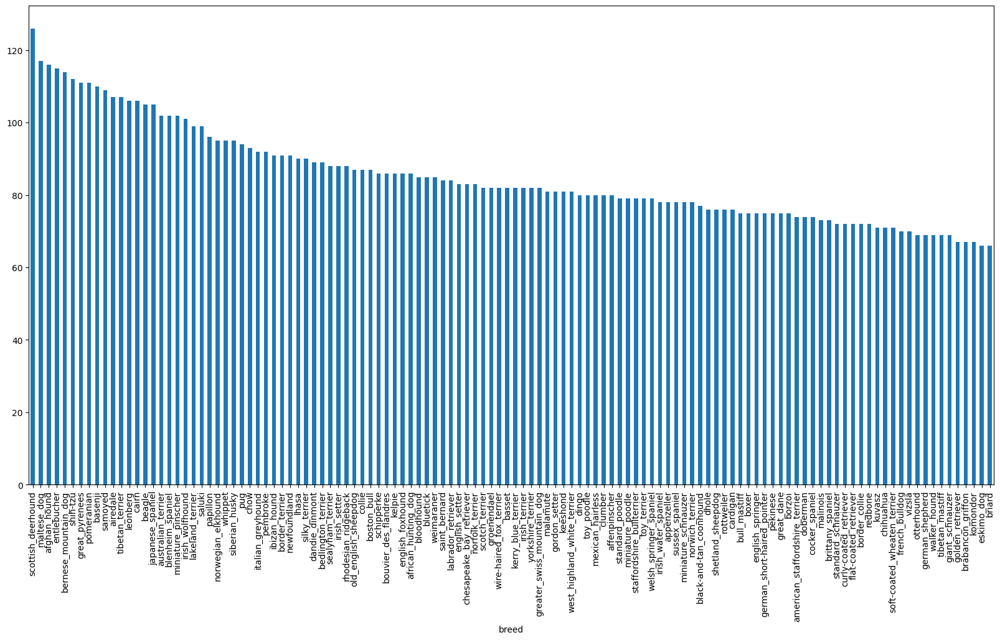

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

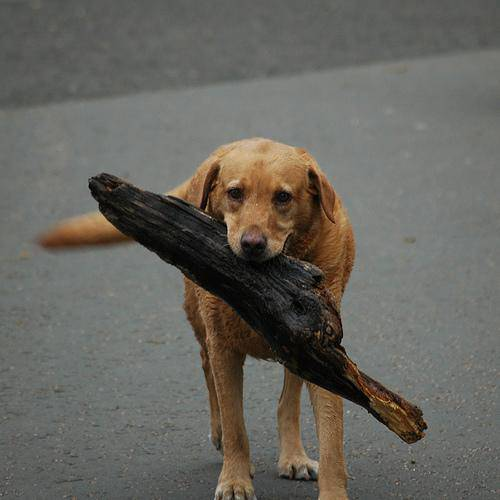

In [ ]:
#Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/dog_vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

## **Getting images and their lables**

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/dog_vision/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv['id']]

#Check the first 10
filenames[:10]

['/content/drive/MyDrive/dog_vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog_vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog_vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog_vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog_vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog_vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog_vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog_vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dog_vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dog_vision/dog-breed-

In [ ]:
#Check whether number of filenames matches number of actual image files
len(filenames)

10222

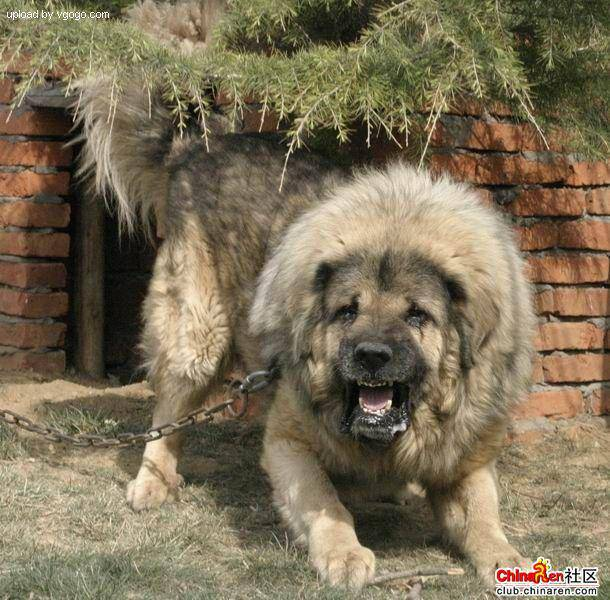

In [ ]:
#One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

## **Preparing the Data**

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
#verifying the lenght of data is still the same
len(labels)

10222

In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
print(labels[0] == unique_breeds)

boston_bull
[False False False False False False False False False False False False
 False False False False False False False  True False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]


In [ ]:
# Turn every label into a boolean array
bool_labels = [label == unique_breeds for label in labels]
bool_labels[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(bool_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0])
print(bool_labels[0])
print(np.argmax(bool_labels[0]))

# Print the labels in integer types
print(bool_labels[0].astype(int))

boston_bull
[False False False False False False False False False False False False
 False False False False False False False  True False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
# Print lable for array number 2

print(labels[2])
print(bool_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## **Creating a Validation set**

In [ ]:
# Setup X & y variables
X = filenames
y = bool_labels

In [ ]:
len(filenames)

10222

Since we have 10,000+ images, to increase processing speed experimentation will start with ~1,000 images for a start then it would be increased as needed.

In [ ]:
# Set number of imgaes to use for experimenting to 1000
num_images = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
#Let's split the data into train set and validation set
from sklearn.model_selection import train_test_split

#Split them into two different sets for training and validation of total size NUM_IMAGES
X_train, X_valid, y_train, y_valid = train_test_split(X[:num_images],
                                                      y[:num_images],
                                                      test_size=0.2,
                                                      random_state=42)

len(X_train), len(X_valid), len(y_train), len(y_valid)

(800, 200, 800, 200)

In [ ]:
# Quick look at the training data
X_train[:2], y_train[:2]

(['/content/drive/MyDrive/dog_vision/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/dog_vision/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, 

## **Preprocessing Images (turning images into Tensors)**

To preprocess the images into Tensors, I'm going to write a function that does the following things:
1. Take an `image` filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn the `image` (a jpg) into Tensors
4. Normalize the `image` (convert colour channels from 0-255 to 0-1)
4. Resize the `image` to be a shape of (224, 224)
5. Return the modified `image`

In [ ]:
#See what importing an image looks like.
#Convert image to Numpy array
from matplotlib.image import imread
import matplotlib.pyplot as plt
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
#Turn image into a Tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path (string) and turns it into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Decode it into a tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image (to the same size as TensorFlow desired values of 224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])
  return image

## **Turning the data into batches**

In [ ]:
# Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path (string) and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]),  tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now to turn all data into tuples of Tensors in the form: `(image, label)`, it would be done through a function that turns all data (`X` & `y`) into batches.

In [ ]:
# Define the batch size, 32
BATCH_SIZE = 32

# Create a functio to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have enough labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch # Added return statement for test_data block

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data: # Fixed indentation
        print("Creating validation data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepaths
                                               tf.constant(y))) #labels # Fixed indentation and missing parenthesis
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch # Added return statement for valid_data block

  else: # Fixed indentation
      print("Creating training data batches...")
    # If the data is a training dataset, we shuffle it
      data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepaths
                                               tf.constant(y))) # Fixed indentation

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling image
      data = data.shuffle(buffer_size=len(x)) # Fixed indentation

    # Create (image, label) tuples (thus also turns the image path into a preprocessed image)
      data = data.map(get_image_label) # Fixed indentation

    # Turn the training data into batches
      return data.batch(BATCH_SIZE) # Fixed indentation

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_valid, y_valid, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of the data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## **Visualizing Data Batches**

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 7))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    # Convert the label tensor to a NumPy array and then find the argmax
    plt.title(unique_breeds[np.argmax(labels[i])])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(iter(train_data))
train_images.shape, train_labels.shape

(TensorShape([32, 224, 224, 3]), TensorShape([32, 120]))

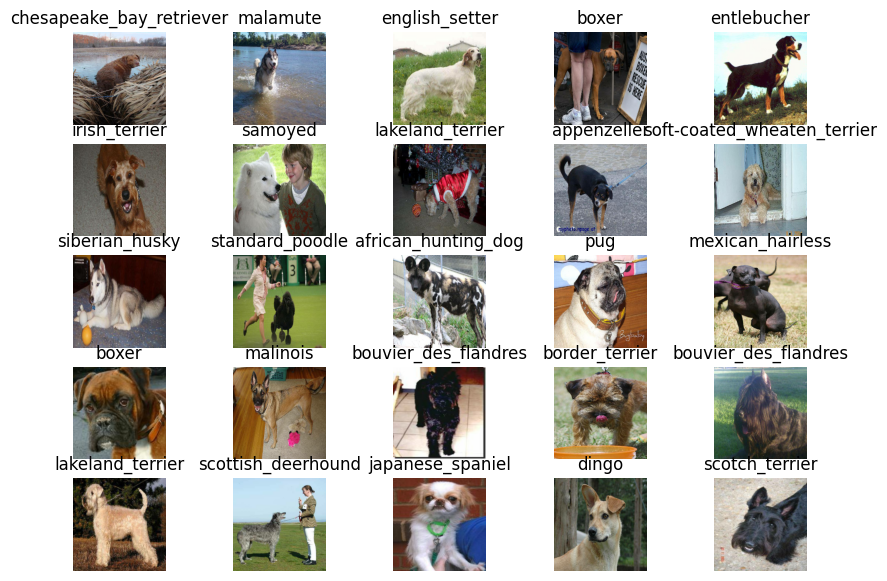

In [ ]:
#Now to visualize the data in a training batch
show_25_images(train_images, train_labels)

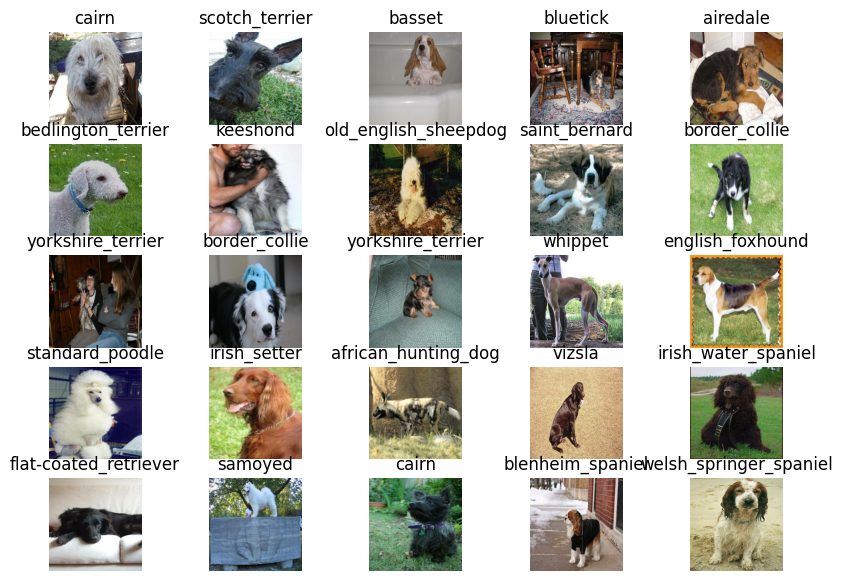

In [ ]:
# Now to visualize the validation set
valid_images, valid_labels = next(iter(valid_data))
show_25_images(valid_images, valid_labels)

## **Building the model**

First, we need to define a few things:
* The input shape (the images are shaped, in the form of Tensors) to the model.
* The output shape (the image labels, in the form of Tensors) of the model.
* The URL of the model we want to use from Kaggle.

In [ ]:
IMG_SIZE

224

In [ ]:
#Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

Now that the inputs, outputs and model are ready to go. I'll put it all together in a Keras deep learning model!

Hence, I'll create a function which:
1. Takes the input shape, output shape and the model chose as parameters.
2. Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
3. Compiles the model (says how it should be evaluated and improved).
4. Builds the model (tells the model the input shape it'll be getting).
5. Returns the model.

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  """
  Takes an input shape, output shape and a model URL and
  compiles and builds a Keras model for multi-class
  classification.
  """
  # Download the pretrained model from TensorFlow Hub
  print("Downloading model from TensorFlow Hub...")
  hub_layer = hub.KerasLayer(MODEL_URL, trainable=False)

  # Create a model
  print("Building model...")
  model = tf.keras.Sequential([
    hub_layer,
    tf.keras.layers.Dense(OUTPUT_SHAPE, activation="softmax") #Layer 2 (output layer)
  ])

  # Compile the model
  print("Compiling model...")
  model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=["accuracy"]
  )

  # Build the model
  print("Building model...")
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()

Building model...
Compiling model...
Building model...


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## **Creating Callbacks**

Callbacks are functions the model uses during training to save its progress, check its progress or stop training early if it stops improving.

I'll create two callbacks, one for **TensorBoard** which helps track our models progress and another for **early stopping** which prevents the model from training for too long.

### TensorBoard Callback

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
import os

# Create a function to build a TensorBoard callback
def create_tensorboard_callback(dir_name, experiment_name):
  """
  Create a log directory for storing  TensorBoard logs.
  """
  # Create a log directory with current time
  log_dir = os.path.join("/content/drive/MyDrive/dog_vision/dog-breed-identification/logs",  # Make it so the log gets tracked whenever we run an experiment
                         dir_name, experiment_name, datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(log_dir=log_dir)

### Early Stopping Callback

Meant to stop the model from overfitting by stopping the training if a certain evaluation metric stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## **Training the model**

In [ ]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available!" if tf.config.list_physical_devices("GPU") else "not available!")

GPU not available!


Now to create a function which trains the model
* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on the model passing it the training data, validation data, number of epochs, number of epochs to train for (`NUM_EPOCHS`) and the callback we'd like to use.
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a Keras model and returns it.
  """
  # Create a model
  model = create_model()

  # Define dir_name and experiment_name within the function
  dir_name = "logs"
  experiment_name = "my_experiment"

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback(dir_name, experiment_name) # Pass dir and experiment name

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model() # Call the function without arguments

Building model...
Compiling model...
Building model...
Epoch 1/100
25/25 [==============================] - 157s 6s/step - loss: 4.5237 - accuracy: 0.0988 - val_loss: 3.3946 - val_accuracy: 0.3450
Epoch 2/100
25/25 [==============================] - 71s 3s/step - loss: 1.6007 - accuracy: 0.6825 - val_loss: 2.1653 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 68s 3s/step - loss: 0.5521 - accuracy: 0.9463 - val_loss: 1.7032 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 59s 2s/step - loss: 0.2475 - accuracy: 0.9875 - val_loss: 1.5204 - val_accuracy: 0.6600
Epoch 5/100
25/25 [==============================] - 61s 2s/step - loss: 0.1440 - accuracy: 0.9987 - val_loss: 1.4525 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 62s 2s/step - loss: 0.0975 - accuracy: 1.0000 - val_loss: 1.4093 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================] - 69s 3s/step - loss: 0.0734 - accuracy: 1.0000

### Checking the TensorBoard logs
This function will access the logs directory that was created earlier and visualize its content

In [ ]:
# Check the tensorboard content
%tensorboard --logdir /content/drive/MyDrive/dog_vision/dog-breed-identification/logs

<IPython.core.display.Javascript object>

## **Making Predictions with the Model**

### Making and evaluating predictions using a trained model

In [ ]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train the model)
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 19s 2s/step


array([[2.31624348e-03, 4.65076620e-04, 9.56307398e-04, ...,
        8.89657589e-04, 4.47828555e-04, 1.85027439e-03],
       [8.19686102e-04, 9.50959511e-04, 2.12390181e-02, ...,
        6.28022186e-04, 2.70756707e-03, 2.99887597e-05],
       [1.18737034e-05, 1.09991095e-04, 4.99237904e-05, ...,
        3.59649966e-05, 1.72071086e-05, 1.09839624e-04],
       ...,
       [2.14292268e-05, 3.09634168e-04, 7.92103456e-05, ...,
        4.19507887e-05, 1.57709408e-04, 3.21487780e-04],
       [2.35063769e-02, 1.70176814e-03, 2.50501442e-04, ...,
        7.56251626e-04, 1.73316832e-04, 2.69866493e-02],
       [1.21982397e-04, 1.45399872e-05, 1.17810641e-03, ...,
        2.22394569e-03, 1.45315321e-03, 1.13283284e-04]], dtype=float32)

In [ ]:
# First Predictio
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}")
print(f"Sum: {np.sum(predictions[0])}")
print(f"Max index: {np.argmax(predictions[0])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # Changed 'index' to 0
print(f"Argmax: {np.argmax(predictions[0])}")

[2.31624348e-03 4.65076620e-04 9.56307398e-04 8.11434511e-05
 1.16037925e-04 1.40533026e-04 5.77874621e-03 1.63371582e-03
 4.10975306e-04 2.42119349e-04 2.07731588e-04 5.41426562e-05
 6.80219790e-04 4.46296035e-05 2.32466919e-04 7.82903866e-04
 2.03412113e-04 1.56136200e-01 3.33227799e-05 3.80173187e-05
 2.93028104e-04 6.35319273e-04 4.94317137e-05 1.03266619e-03
 6.69746732e-05 3.30787851e-04 2.52418101e-01 3.64596985e-04
 1.09766563e-03 1.68758200e-03 2.24655858e-04 4.78513597e-04
 6.22757827e-04 2.71462613e-05 2.82871595e-04 1.11899562e-01
 1.26976329e-05 9.25601402e-04 9.54076022e-05 3.18343198e-04
 3.02866613e-03 1.33799840e-05 3.75024654e-04 1.49751213e-04
 1.76024070e-04 3.94647650e-04 7.34681089e-05 3.17562983e-04
 2.83003028e-04 5.85792237e-04 6.49052265e-04 3.46360495e-04
 7.51104439e-04 9.13969343e-05 2.01510949e-04 9.21753235e-05
 7.53526576e-04 2.58893403e-03 9.68077977e-04 8.11417624e-02
 6.63358602e-04 2.02871597e-05 1.79026229e-03 3.96278556e-05
 2.59077409e-03 1.929317

In [ ]:
# Function to turn prediction probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
 # Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[9])
pred_label

'collie'

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Turns a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [ ]:
#Unbatchify the validation data
val_images, val_labels = unbatchify(valid_data)
val_images [0], val_labels[90]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

Now to create a function which does the following:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Converts the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the truth image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, truth_label, image, n=1):
  """
  View the prediction, ground truth and image for sample n.
  """
  pred_prob, True_label, img = prediction_probabilities[n], truth_label[n], image[n]

  # Get the prediction label
  pred_label = get_pred_label(prediction_probabilities[n])

  # Plot image & remove ticks
  plt.imshow(img)
  plt.xticks([])
  plt.yticks([])

  # Change plot title to be the predicted, probability of prediction and truth label
  # Directly compare pred_label and True_label as they are expected to be single values
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                  np.max(pred_prob) * 100,
                                  True_label),
                                  color="green" if (pred_label == True_label) else "red") # Removed .all()

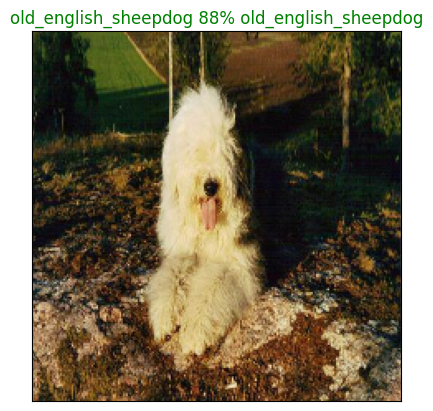

In [ ]:
plot_pred(prediction_probabilities=predictions,
          truth_label=val_labels,
          image=val_images,
          n=7)

Now to create a function to view the model's top 10 predictions. The function will work as follows:
* Take an input of prediction probabilities array and a ground truth array and an integer.
* Find the prediction using `get_pred_label`
* Find the top 10: prediction probabilities indexes, Prediction probabilities values & prediction labels.
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  # Get the predicted label
  pred_label = get_pred_label(prediction_probabilities[n])
  pred_conf = prediction_probabilities[n][np.argmax(prediction_probabilities[n])]

  # Find the top 10 prediction confidence Indexes
  top_10_pred_indexes = prediction_probabilities[n].argsort()[-10:][::-1] # Get indexes from the nth sample

  # Find the top 10 prediction confidence values
  top_10_pred_conf = prediction_probabilities[n][top_10_pred_indexes] # Get values from the nth sample

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Plot the top 10 prediction confidences
  # Use np.arange instead of np.arrange
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_conf,
                     color="gray")
  # Use np.arange instead of np.arrange
  plt.xticks(np.arange(len(top_10_pred_labels)),
             top_10_pred_labels,
             rotation="vertical")

  # Change the color of the true label
  true_label = labels[n] # Get true label of nth sample
  if np.isin(true_label, top_10_pred_labels): # Make sure this if statement is indented correctly
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else: # Make sure this else statement is indented at the same level as the if statement
      pass

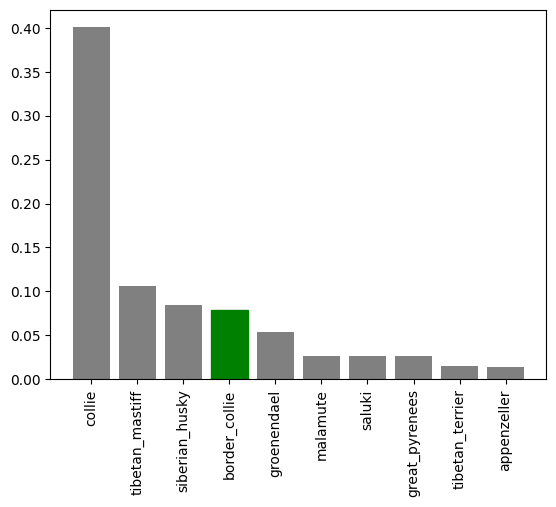

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=9)

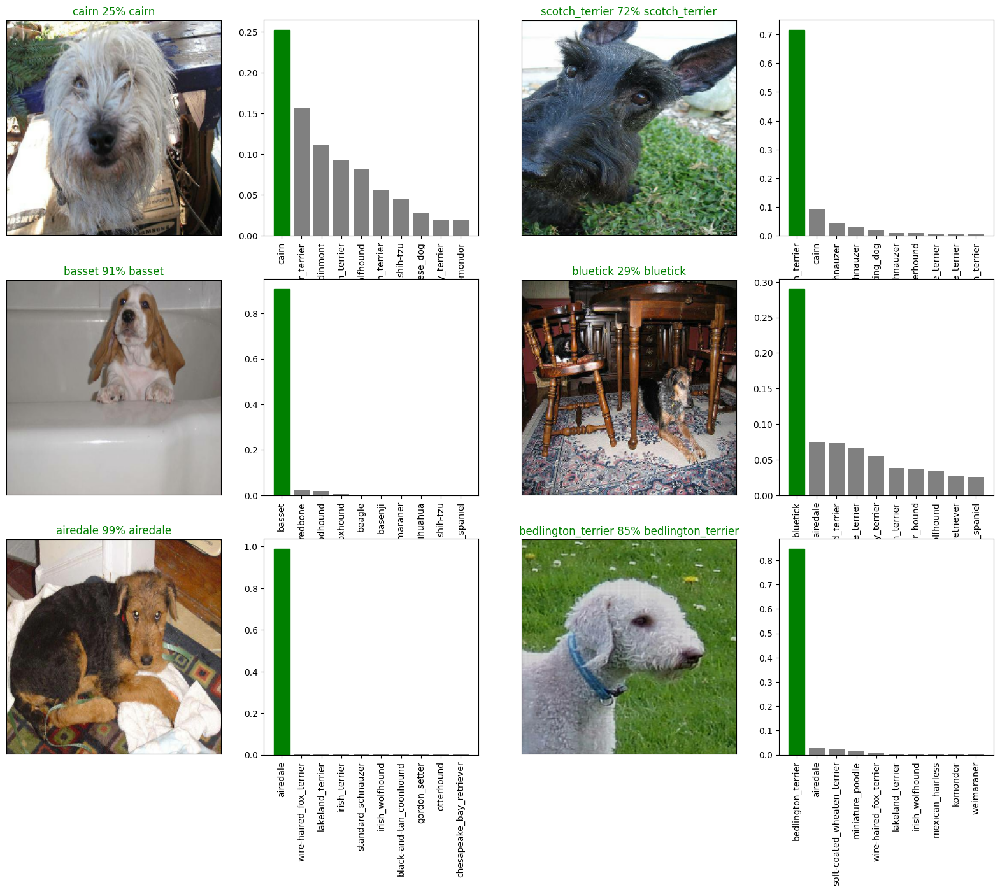

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            truth_label=val_labels,
            image=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=i+i_multiplier)
plt.show()

In [ ]:
# Evaluate the pre-saved model
model.evaluate(valid_data)

7/7 [==============================] - 11s 1s/step - loss: 1.3802 - accuracy: 0.6600


[1.3801649808883667, 0.6600000262260437]

## **Saving and Loading the Model**

In [ ]:
# Creating a function to save the model
def save_model(model, suffix=None):
  """
  Saves the Keras model in a TensorFlow SavedModel format.
  """
  # Create a model directory with current time
  modeldir = os.path.join("/content/drive/MyDrive/dog_vision/dog-breed-identification/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Creating a function to load a trained model
def load_model(model_path):
  """
  Loads a TensorFlow SavedModel from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
# Now to save the model trained on 1000 images
save_model(model, suffix="1000_images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/dog_vision/dog-breed-identification/models/20240719-161328-1000_images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/dog_vision/dog-breed-identification/models/20240719-161328-1000_images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
Loaded_1000_image_model = load_model('/content/drive/MyDrive/dog_vision/dog-breed-identification/models/20240719-161328-1000_images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/dog_vision/dog-breed-identification/models/20240719-161328-1000_images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the loaded model
Loaded_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 15s 2s/step - loss: 1.3802 - accuracy: 0.6600


[1.3801649808883667, 0.6600000262260437]